<a href="https://colab.research.google.com/github/geral108/SEMANA3/blob/main/PERROSYGATOS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

REDES NEURONALES PERROS Y GATOS

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds

datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/incomplete.OCYQV2_4.0.1/cats_vs_dogs-train.tfrecord*...:   0%…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


In [2]:
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir='/root/tensorflow_datasets/cats_vs_dogs/4.0.1',
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    nondeterministic_order=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, Jo

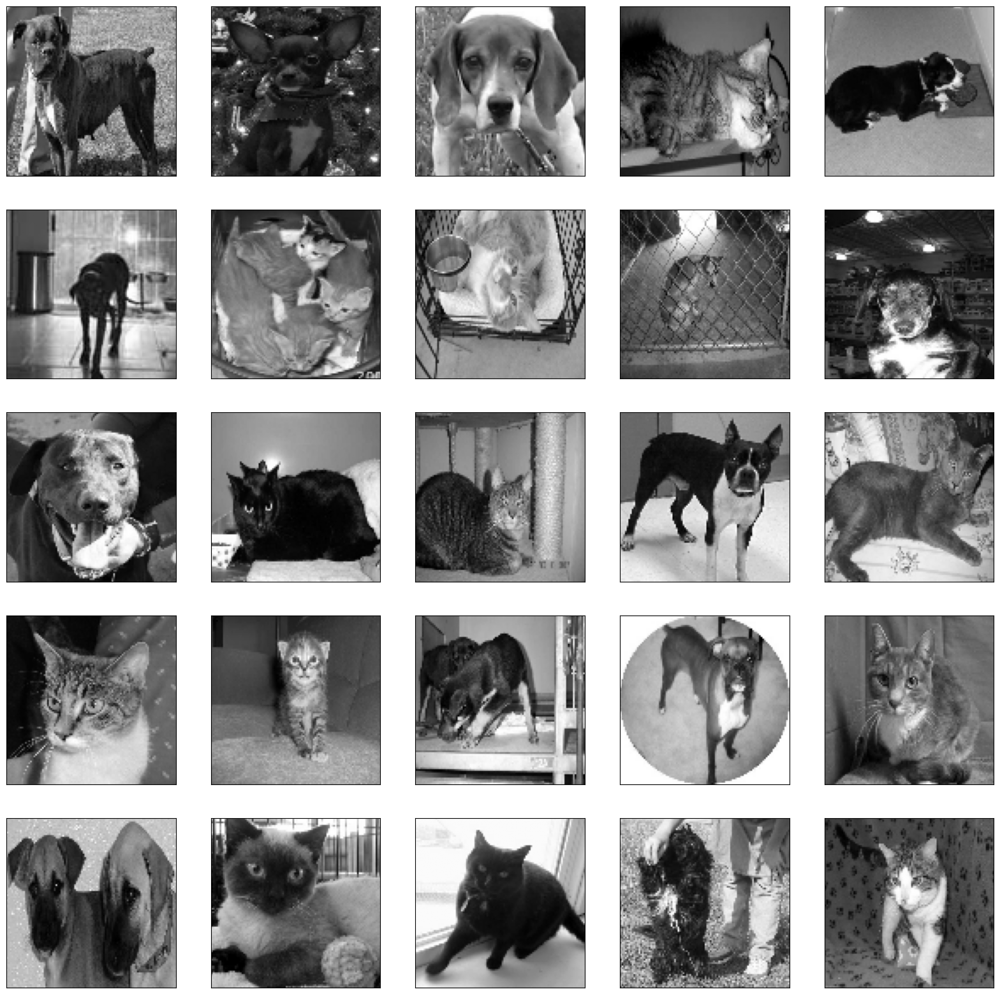

In [3]:
import matplotlib.pyplot as plt
import cv2

plt.figure(figsize=(20 , 20))
TAMANO_IMG = 100

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(imagen, cmap='gray')

In [4]:
datos_entrenamiento = []

In [5]:
for i, (imagen, etiqueta) in enumerate(datos['train']):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)
  datos_entrenamiento.append([imagen, etiqueta])

In [6]:
datos_entrenamiento[0]

[array([[[249],
         [190],
         [105],
         ...,
         [189],
         [196],
         [143]],
 
        [[232],
         [127],
         [ 88],
         ...,
         [187],
         [180],
         [186]],
 
        [[171],
         [ 87],
         [ 83],
         ...,
         [129],
         [158],
         [166]],
 
        ...,
 
        [[113],
         [173],
         [162],
         ...,
         [143],
         [156],
         [119]],
 
        [[140],
         [152],
         [171],
         ...,
         [ 98],
         [155],
         [154]],
 
        [[ 91],
         [109],
         [167],
         ...,
         [ 46],
         [ 51],
         [ 47]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [7]:
len(datos_entrenamiento)

23262

In [8]:
x = []#imagnes de entrada(pixeles)
y = [] #etiquetas

for imagen, etiqueta in datos_entrenamiento:
  x.append(imagen)
  y.append(etiqueta)

In [9]:
x

[array([[[249],
         [190],
         [105],
         ...,
         [189],
         [196],
         [143]],
 
        [[232],
         [127],
         [ 88],
         ...,
         [187],
         [180],
         [186]],
 
        [[171],
         [ 87],
         [ 83],
         ...,
         [129],
         [158],
         [166]],
 
        ...,
 
        [[113],
         [173],
         [162],
         ...,
         [143],
         [156],
         [119]],
 
        [[140],
         [152],
         [171],
         ...,
         [ 98],
         [155],
         [154]],
 
        [[ 91],
         [109],
         [167],
         ...,
         [ 46],
         [ 51],
         [ 47]]], dtype=uint8),
 array([[[149],
         [114],
         [ 93],
         ...,
         [103],
         [ 72],
         [ 81]],
 
        [[127],
         [ 63],
         [ 79],
         ...,
         [131],
         [ 70],
         [ 98]],
 
        [[ 82],
         [ 65],
         [ 58],
         ...,
      

In [10]:
import numpy as np

x = np.array(x).astype(float) / 255

In [11]:
y

[<tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64, numpy=0>,
 <tf.Tensor: shape=(), dtype=int64, numpy=1>,
 <tf.Tensor: shape=(), dtype=int64

In [12]:
y = np.array(y)

In [13]:
x.shape

(23262, 100, 100, 1)

In [14]:
modeloDenso = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(150, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
    ])

modeloCNN2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 1)),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2, 2),

    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(250, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
    ])

/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [15]:
modeloDenso.compile(optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

modeloCNN.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

modeloCNN2.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [16]:
from tensorflow.keras.callbacks import TensorBoard

In [17]:
tensorboardDenso = TensorBoard(log_dir='logs/denso')
modeloDenso.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardDenso])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - accuracy: 0.5276 - loss: 0.7817 - val_accuracy: 0.5908 - val_loss: 0.6647
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.5821 - loss: 0.6716 - val_accuracy: 0.5519 - val_loss: 0.6851
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.5963 - loss: 0.6679 - val_accuracy: 0.5851 - val_loss: 0.6714
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5954 - loss: 0.6647 - val_accuracy: 0.6014 - val_loss: 0.6683
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.6022 - loss: 0.6616 - val_accuracy: 0.6011 - val_loss: 0.6671
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6008 - loss: 0.6584 - val_accuracy: 0.5860 - val_loss: 0.6848
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5968 - loss: 0.6631 - val_accuracy: 0.5926 - val_loss: 0.6686
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6016 - loss: 0.6598 - val_accu

In [18]:
%load_ext tensorboard

In [19]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [20]:
tensorboardCNN = TensorBoard(log_dir='logs/cnn')
modeloCNN.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - accuracy: 0.6015 - loss: 0.6495 - val_accuracy: 0.7493 - val_loss: 0.5130
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 13s 13ms/step - accuracy: 0.7694 - loss: 0.4799 - val_accuracy: 0.7960 - val_loss: 0.4446
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.8051 - loss: 0.4168 - val_accuracy: 0.7971 - val_loss: 0.4283
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.8471 - loss: 0.3488 - val_accuracy: 0.8352 - val_loss: 0.3712
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.8805 - loss: 0.2839 - val_accuracy: 0.8415 - val_loss: 0.3660
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.9088 - loss: 0.2222 - val_accuracy: 0.8441 - val_loss: 0.3824
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.9365 - loss: 0.1611 - val_accuracy: 0.8450 - val_loss: 0.3920
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.9629 - loss: 0.10

In [21]:
tensorboardCNN2 = TensorBoard(log_dir='logs/cnn2')
modeloCNN2.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 16s 19ms/step - accuracy: 0.5845 - loss: 0.6631 - val_accuracy: 0.7143 - val_loss: 0.5677
Epoch 2/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.7327 - loss: 0.5354 - val_accuracy: 0.7628 - val_loss: 0.4864
Epoch 3/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.7849 - loss: 0.4569 - val_accuracy: 0.7948 - val_loss: 0.4343
Epoch 4/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.8143 - loss: 0.4093 - val_accuracy: 0.7977 - val_loss: 0.4351
Epoch 5/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 11s 14ms/step - accuracy: 0.8412 - loss: 0.3611 - val_accuracy: 0.8284 - val_loss: 0.3879
Epoch 6/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - accuracy: 0.8588 - loss: 0.3194 - val_accuracy: 0.8266 - val_loss: 0.3870
Epoch 7/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.8766 - loss: 0.2866 - val_accuracy: 0.8415 - val_loss: 0.3643
Epoch 8/100
618/618 ━━━━━━━━━━━━━━━━━━━━ 8s 13ms/step - accuracy: 0.8959 - loss: 0.249

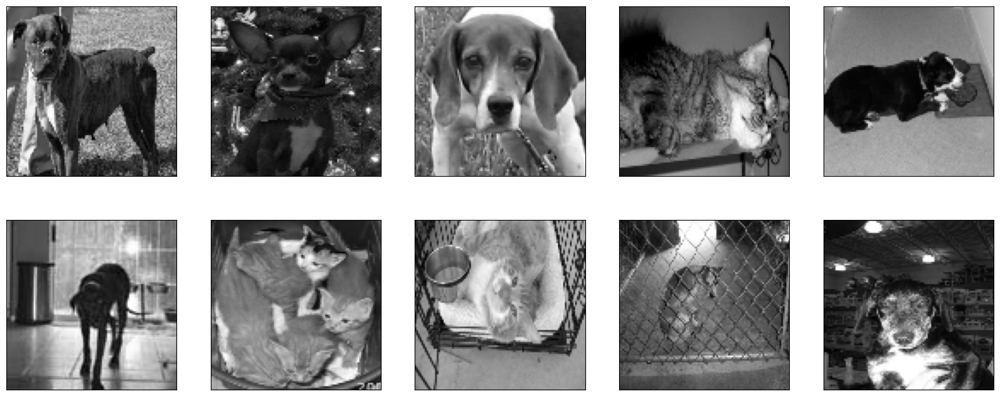

In [22]:
#ver las imagenes de la variable X sin modificaciones por aumento de datos
plt.figure(figsize=(20, 8))
for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(x[i].reshape(100, 100), cmap="gray")

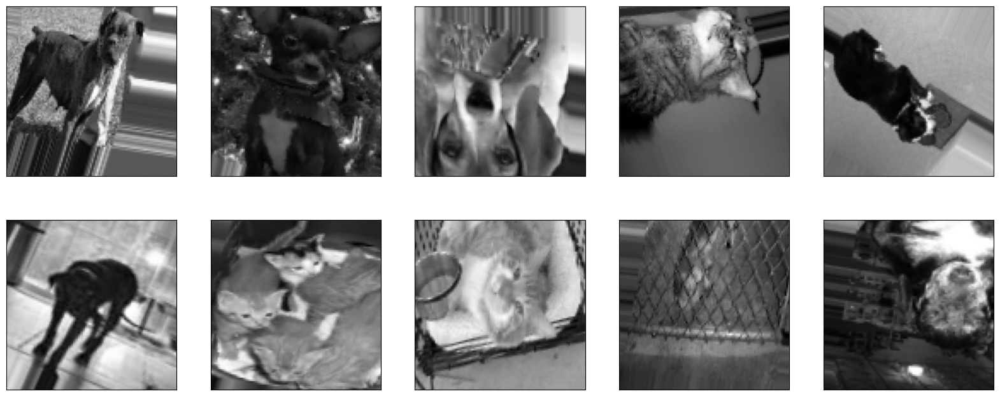

In [23]:
#Realizar el aumento de datos con varias transformaciones. Al final, graficar 10 como ejemplo
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)

datagen.fit(x)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(x, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap="gray")
  break


In [24]:
modeloDenso_AD = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])


/usr/local/lib/python3.12/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [25]:
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy',
                    metrics=['accuracy'])

In [26]:
#Separar los datos de entrenamiento y los datos de pruebas en variables diferentes

len(x) * .85 #19700
len(x) - 19700 #3562

X_entrenamiento = x[:19700]
X_validacion = x[19700:]

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [27]:
data_gen_entrenamiento = datagen.flow(X_entrenamiento, y_entrenamiento, batch_size=32)

In [28]:
import gc
gc.collect()

29398

In [ ]:
tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD')

modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardDenso_AD]
)

Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


616/616 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - accuracy: 0.5087 - loss: 0.7595 - val_accuracy: 0.5278 - val_loss: 0.6940
Epoch 2/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - accuracy: 0.4962 - loss: 0.6954 - val_accuracy: 0.5084 - val_loss: 0.6931
Epoch 3/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 40s 33ms/step - accuracy: 0.5013 - loss: 0.6933 - val_accuracy: 0.4921 - val_loss: 0.6934
Epoch 4/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - accuracy: 0.5067 - loss: 0.6931 - val_accuracy: 0.5146 - val_loss: 0.6928
Epoch 5/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - accuracy: 0.5011 - loss: 0.6942 - val_accuracy: 0.4921 - val_loss: 0.6934
Epoch 6/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - accuracy: 0.4968 - loss: 0.6933 - val_accuracy: 0.4921 - val_loss: 0.6933
Epoch 7/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - accuracy: 0.5038 - loss: 0.6932 - val_accuracy: 0.4921 - val_loss: 0.6933
Epoch 8/100
616/616 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - accuracy: 0.4983 - loss: 0.6932 - val_

In [ ]:
tensorboardCNN_AD = TensorBoard(log_dir='logs-new/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=150, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD]
)


In [ ]:
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')

modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(X_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(X_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(X_validacion) / float(32))),
    callbacks=[tensorboardCNN2_AD]
)


In [ ]:
modeloCNN_AD.save('perros-gatos-cnn-ad.h5')

In [ ]:
!pip install tensorflowjs

In [ ]:
!mkdir carpeta_salida

In [ ]:
!tensorflowjs_converter --input_format keras perros-gatos-cnn-ad.h5 carpeta_salida